# G-PARC Elastoplastic Demo: Architecture Walkthrough, Inference & Comparison

This notebook demonstrates three neural network architectures for predicting 2D elasto-plasto-dynamic simulations from the **PLAID** benchmark dataset:

| Model | Paradigm | Key Innovation |
|-------|----------|----------------|
| **G-PARCv1** | GNN (GAT + GraphUNet) | Physics-Aware Recurrent Convolutions — Feature Extractor → Derivative GNN → Integral GNN |
| **G-PARCv2** | GNN (GraphConv + MLS) | Numerical integration (Euler/Heun/RK4) with Moving Least Squares differential operators |
| **MeshGraphKAN** | Message-passing GNN | NVIDIA MeshGraphNet with Kolmogorov-Arnold Network (KAN) node encoder |

**What this notebook covers:**
1. **Architecture Walkthrough** — Interactive exploration of each model's structure and parameter counts
2. **Load Models & Run Inference** — Load trained checkpoints and generate rollout predictions
3. **Full Evaluation Pipeline** — RRMSE, R², RMSE metrics with erosion masking
4. **Cross-Architecture Comparison** — Side-by-side dashboards, scatter plots, and GIFs

---

## Dataset: PLAID 2D Elasto-Plasto-Dynamics

- **Physics**: High-velocity impact on steel plates → large plastic deformation + element erosion
- **Variables**: Displacement field $(U_x, U_y)$ — 2 dynamic features
- **Static features**: Node positions $(x, y)$ — 2 static features  
- **Normalization**: Global max (positions by `max_position`, displacements by `max_displacement`)
- **Meshes**: Unstructured tri elements with varying node counts per simulation


## 0. Setup & Configuration

In [1]:
import sys, os, json, warnings, re
from pathlib import Path
from collections import defaultdict
from huggingface_hub import hf_hub_download

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
from matplotlib.animation import PillowWriter, FuncAnimation
from matplotlib.collections import PolyCollection
from matplotlib.colors import Normalize
from matplotlib.gridspec import GridSpec
import matplotlib.cm as cm
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from tqdm.notebook import tqdm
from IPython.display import Image, display, HTML
import pandas as pd

warnings.filterwarnings("ignore", category=UserWarning)

# ============================================================
# PROJECT ROOT — adjust to your repo layout
# ============================================================
PROJECT_ROOT = Path("../..")
sys.path.insert(0, str(PROJECT_ROOT))

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

Device: cuda


In [2]:
# ============================================================
# DATA & MODEL LOADING FROM HUGGING FACE HUB
# ============================================================
import requests

USE_HF = True
HF_REPO = "jacktbeerman/Gparc"
CACHE_DIR = Path.home() / ".cache" / "gparc_demo"

LOCAL_TEST_DIR = Path("/scratch/jtb3sud/processed_elasto_plastic/global_max/normalized/small/test")
LOCAL_CHECKPOINTS = {
    'G-PARCv1':     Path("/scratch/jtb3sud/elasto_graphconv_V2/gparcv1/best_model.pth"),
    'G-PARCv2':     Path("/scratch/jtb3sud/elasto_graphconv_V2/2hop/best_model.pth"),
    'MeshGraphKAN': Path("/scratch/jtb3sud/elasto_meshgraphkan/run1/best_model.pth"),
}

def hf_get(filename):
    """Download from HuggingFace with simple caching. No tqdm dependency."""
    local_path = CACHE_DIR / filename
    if local_path.exists() and local_path.stat().st_size > 0:
        return local_path
    local_path.parent.mkdir(parents=True, exist_ok=True)
    url = f"https://huggingface.co/{HF_REPO}/resolve/main/{filename}"
    print(f"  Downloading {filename}...", end=" ", flush=True)
    r = requests.get(url, stream=True)
    r.raise_for_status()
    with open(local_path, 'wb') as f:
        for chunk in r.iter_content(chunk_size=8 * 1024 * 1024):
            f.write(chunk)
    size_mb = local_path.stat().st_size / (1024 * 1024)
    print(f"✓ ({size_mb:.1f} MB)")
    return local_path

if USE_HF:
    print(f"Downloading artifacts from HuggingFace: {HF_REPO}")
    print("(Files are cached locally after first download)\n")
    
    CHECKPOINTS = {
        'G-PARCv1':     hf_get("checkpoints/gparcv1_best.pth"),
        'G-PARCv2':     hf_get("checkpoints/gparcv2_best.pth"),
        'MeshGraphKAN': hf_get("checkpoints/meshgraphkan_best.pth"),
    }
    CONFIG_FILES = {
        'G-PARCv1':     hf_get("configs/gparcv1_config.json"),
        'G-PARCv2':     hf_get("configs/gparcv2_config.json"),
        'MeshGraphKAN': hf_get("configs/meshgraphkan_config.json"),
    }
    HISTORY_FILES = {
        'G-PARCv1':     hf_get("training_histories/gparcv1_history.json"),
        'G-PARCv2':     hf_get("training_histories/gparcv2_history.json"),
        'MeshGraphKAN': hf_get("training_histories/meshgraphkan_history.json"),
    }
    NORM_STATS_FILE = hf_get("data/normalization_stats.json")
    
    test_sims = [
        "data/test/simulation_179.pt", "data/test/simulation_191.pt",
        "data/test/simulation_337.pt", "data/test/simulation_384.pt",
        "data/test/simulation_395.pt", "data/test/simulation_490.pt",
        "data/test/simulation_676.pt", "data/test/simulation_989.pt",
    ]
    test_paths = [hf_get(f) for f in test_sims]
    TEST_DIR = test_paths[0].parent

else:
    print("Using local HPC paths")
    TEST_DIR = LOCAL_TEST_DIR
    NORM_STATS_FILE = TEST_DIR.parent / "normalization_stats.json"
    CHECKPOINTS = LOCAL_CHECKPOINTS
    CONFIG_FILES = {
        'G-PARCv1':     LOCAL_CHECKPOINTS['G-PARCv1'].parent / "config.json",
        'G-PARCv2':     LOCAL_CHECKPOINTS['G-PARCv2'].parent / "config.json",
        'MeshGraphKAN': LOCAL_CHECKPOINTS['MeshGraphKAN'].parent / "config.json",
    }
    HISTORY_FILES = {
        'G-PARCv1':     LOCAL_CHECKPOINTS['G-PARCv1'].parent / "training_history.json",
        'G-PARCv2':     LOCAL_CHECKPOINTS['G-PARCv2'].parent / "training_history.json",
        'MeshGraphKAN': LOCAL_CHECKPOINTS['MeshGraphKAN'].parent / "training_history.json",
    }

OUTPUT_DIR = Path("./demo_outputs")
OUTPUT_DIR.mkdir(exist_ok=True, parents=True)
print("\n✓ All artifacts ready")

(Files are cached locally after first download)


✓ All artifacts ready


---
## 1. Architecture Walkthrough

### 1.1 G-PARCv1 — Physics-Aware Recurrent Convolutions (GNN Baseline)

G-PARCv1 uses a purely learned approach with three GNN modules:

```
Static Features [N, 2] ──→ FeatureExtractorGNN (GAT + GraphUNet) ──→ Learned Static [N, 128]
                                                                          │
Dynamic State [N, 2] ─────────────────────────────────────────────────────┤
                                                                          ▼
                                                              cat([Static, Dynamic]) [N, 130]
                                                                          │
                                                              DerivativeGNN (GAT layers) ──→ dφ/dt [N, 2]
                                                                          │
                                                              IntegralGNN (GAT layers) ──→ Δφ [N, 2]
                                                                          │
                                                              φ_{t+1} = φ_t + Δφ
```

**Key properties:**
- Feature extractor processes static features **once** per sequence (efficient)
- Derivative and Integral solvers are separate GNN modules (interpretable as physics operators)
- No explicit numerical integration — the network learns the integration implicitly

### 1.2 G-PARCv2 — MLS + Numerical Integration

G-PARCv2 replaces learned GNN operators with **Moving Least Squares (MLS)** differential operators:

```
Static Features [N, 2] ──→ GraphConvFeatureExtractorV2 ──→ Learned Static [N, 128]
                                                                │
Dynamic State [N, 2] ──→ MLS Gradient ∇φ ──→ Advection            │
                     ──→ MLS Laplacian ∇²φ ──→ Diffusion          │
                                                                │
                                      SPADE Fusion (cat + GAT) ──→ dφ/dt [N, 2]
                                                                │
                                      Euler / Heun / RK4  ──→ φ_{t+1} = φ_t + dt·dφ/dt
```

**Key properties:**
- MLS operators provide **physics-grounded** spatial derivatives on unstructured meshes
- Numerical integrators (Euler, Heun, RK4) provide **explicit time stepping**
- Dirichlet BC enforcement: boundary nodes are clamped (zero displacement at fixed wall)

### 1.3 MeshGraphKAN — Kolmogorov-Arnold Networks

Based on NVIDIA's PhysicsNeMo MeshGraphNet, with the node encoder replaced by a KAN:

```
Node Features [N, 4] ──→ KAN Encoder (Fourier coefficients) ──→ [N, 128]
Edge Features [E, 3] ──→ MLP Encoder ──→ [E, 128]
                                │
                    Processor: 4× [EdgeBlock, NodeBlock] with residual connections
                                │
                    MLP Decoder (no LayerNorm) ──→ Δφ [N, 2]
                                │
                    φ_{t+1} = φ_t + Δφ  (simple residual)
```

**Key properties:**
- KAN uses **learnable Fourier coefficients** `[2, out, in, harmonics]` with einsum
- Message passing on edges: `concat(src, dst, edge) → MLP → residual`
- No physics priors — purely data-driven encoder-processor-decoder


In [3]:
# ============================================================
# LOAD CONFIGS & COMPARE
# ============================================================
configs = {}
for name, path in CONFIG_FILES.items():
    if path.exists():
        with open(path) as f:
            configs[name] = json.load(f)
        print(f"✓ Loaded config: {name}")
    else:
        print(f"✗ Config not found: {name}")

# Show key architectural differences
if configs:
    comparison = []
    for name, cfg in configs.items():
        row = {
            'Model': name,
            'Hidden Dim': cfg.get('hidden_channels', cfg.get('hidden_dim', '?')),
            'Feature Out': cfg.get('feature_out_channels', cfg.get('hidden_dim', '?')),
            'Seq Len': cfg.get('seq_len', '?'),
            'LR': cfg.get('lr', '?'),
            'Epochs': cfg.get('epochs', '?'),
        }
        comparison.append(row)
    
    df_compare = pd.DataFrame(comparison).set_index('Model')
    display(df_compare)


✓ Loaded config: G-PARCv1
✓ Loaded config: G-PARCv2
✓ Loaded config: MeshGraphKAN


,Hidden Dim,Feature Out,Seq Len,LR,Epochs
Model,,,,,
G-PARCv1,128,128,16,0.00030,1500
G-PARCv2,128,128,16,0.00030,1500
MeshGraphKAN,128,128,16,0.00005,1500


In [4]:
# ============================================================
# BUILD ALL THREE MODELS & COUNT PARAMETERS
# ============================================================
from utilities.featureextractor import FeatureExtractorGNN, GraphConvFeatureExtractorV2
from differentiator.differentiator import DerivativeGNN
from integrator.integrator import IntegralGNN
from differentiator.differentiator import ElastoPlasticDifferentiator
from differentiator.hop import SolveGradientsLST, SolveWeightLST2d
from models.globalelasto import GPARC_ElastoPlastic_Numerical

# Also import GPARCv1
from models.parcv1_elasto import GPARC

# We'll define MeshGraphKAN inline since it's in the training script
# (or import if you've moved it to a module)

def count_params(model, name="Model"):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return {'Model': name, 'Total Params': f"{total:,}", 'Trainable': f"{trainable:,}", 'Total (raw)': total}


# --- G-PARCv1 ---
cfg1 = configs.get('G-PARCv1', {})
fe_v1 = FeatureExtractorGNN(
    in_channels=2, hidden_channels=cfg1.get('hidden_channels', 128),
    out_channels=cfg1.get('feature_out_channels', 128),
    depth=cfg1.get('depth', 3),
    pool_ratios=cfg1.get('pool_ratios', [0.2]),
    heads=cfg1.get('heads', 3), concat=True,
    dropout=cfg1.get('dropout', 0.1),
)
deriv_in = cfg1.get('feature_out_channels', 128) + 2  # fe_out + dynamic
deriv_v1 = DerivativeGNN(
    in_channels=deriv_in, hidden_channels=cfg1.get('deriv_hidden_channels', 128),
    out_channels=2, num_layers=cfg1.get('deriv_num_layers', 3),
    heads=cfg1.get('deriv_heads', 3), concat=True,
    dropout=cfg1.get('deriv_dropout', 0.1),
    use_residual=cfg1.get('deriv_use_residual', True),
)
integ_v1 = IntegralGNN(
    in_channels=2, hidden_channels=cfg1.get('integral_hidden_channels', 128),
    out_channels=2, num_layers=cfg1.get('integral_num_layers', 3),
    heads=cfg1.get('integral_heads', 4), concat=True,
    dropout=cfg1.get('integral_dropout', 0.1),
    use_residual=cfg1.get('integral_use_residual', True),
)
model_v1 = GPARC(
    feature_extractor=fe_v1, derivative_solver=deriv_v1,
    integral_solver=integ_v1,
    num_static_feats=2, num_dynamic_feats=2,
    skip_dynamic_indices=None, feature_out_channels=cfg1.get('feature_out_channels', 128),
)
p1 = count_params(model_v1, "G-PARCv1")

# --- G-PARCv2 ---
cfg2 = configs.get('G-PARCv2', {})

# Load norm stats for pos_mean/pos_std
with open(NORM_STATS_FILE) as f:
    norm_stats = json.load(f)
pos_stats = norm_stats.get('position', {})
pos_mean = [pos_stats.get('x_pos', {}).get('mean', 0), pos_stats.get('y_pos', {}).get('mean', 0)]
pos_std = [pos_stats.get('x_pos', {}).get('std', 1), pos_stats.get('y_pos', {}).get('std', 1)]
max_position = pos_stats.get('max_position', None)
norm_method = norm_stats.get('normalization_method', 'global_max')

gradient_solver = SolveGradientsLST(
    pos_mean=pos_mean, pos_std=pos_std,
    norm_method=norm_method, max_position=max_position,
)
laplacian_solver = SolveWeightLST2d(
    pos_mean=pos_mean, pos_std=pos_std,
    norm_method=norm_method, max_position=max_position,
    min_neighbors=5, use_2hop_extension=False,
)
fe_v2 = GraphConvFeatureExtractorV2(
    in_channels=2, hidden_channels=cfg2.get('hidden_channels', 128),
    out_channels=cfg2.get('feature_out_channels', 128),
    num_layers=cfg2.get('num_layers', 4),
    dropout=cfg2.get('dropout', 0.0),
    use_layer_norm=cfg2.get('use_layer_norm', True),
    use_relative_pos=cfg2.get('use_relative_pos', True),
)
deriv_v2 = ElastoPlasticDifferentiator(
    num_static_feats=2, num_dynamic_feats=2,
    feature_extractor=fe_v2,
    gradient_solver=gradient_solver, laplacian_solver=laplacian_solver,
    n_fe_features=cfg2.get('feature_out_channels', 128),
    list_strain_idx=[0, 1], list_laplacian_idx=[0, 1],
    spade_random_noise=False,
    heads=cfg2.get('spade_heads', 4),
    concat=cfg2.get('spade_concat', True),
    dropout=cfg2.get('spade_dropout', 0.1),
    use_von_mises=cfg2.get('use_von_mises', True),
    use_volumetric=cfg2.get('use_volumetric', True),
    n_state_var=cfg2.get('n_state_var', 0),
    zero_init=cfg2.get('zero_init', True),
)
model_v2 = GPARC_ElastoPlastic_Numerical(
    derivative_solver_physics=deriv_v2,
    integrator_type=cfg2.get('integrator', 'euler'),
    num_static_feats=2, num_dynamic_feats=2,
    pos_mean=pos_mean, pos_std=pos_std,
    boundary_threshold=0.5,
    clamp_output=not cfg2.get('no_clamp_output', True),
    norm_method=norm_method, max_position=max_position,
)
p2 = count_params(model_v2, "G-PARCv2")

print(f"\n{'Model':<20} {'Total Params':>15} {'Trainable':>15}")
print("-" * 52)
for p in [p1, p2]:
    print(f"{p['Model']:<20} {p['Total Params']:>15} {p['Trainable']:>15}")

# MeshGraphKAN parameter count will be added after loading checkpoint
print("\n(MeshGraphKAN params shown after checkpoint loading below)")



Model                   Total Params       Trainable
----------------------------------------------------
G-PARCv1                     688,032         688,032
G-PARCv2                     488,066         488,066

(MeshGraphKAN params shown after checkpoint loading below)


---
## 2. Training Curves Comparison


In [5]:
# ============================================================
# PLOT TRAINING HISTORIES SIDE BY SIDE
# ============================================================
histories = {}
for name, path in HISTORY_FILES.items():
    if path.exists():
        with open(path) as f:
            histories[name] = json.load(f)
        print(f"✓ Loaded history: {name} ({len(histories[name].get('train_loss', []))} epochs)")

if histories:
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    colors = {'G-PARCv1': '#1f77b4', 'G-PARCv2': '#ff7f0e', 'MeshGraphKAN': '#2ca02c'}
    
    # Train loss
    ax = axes[0]
    for name, hist in histories.items():
        # Filter out None values
        train_loss = [x for x in hist['train_loss'] if x is not None]
        ax.plot(train_loss, label=name, color=colors.get(name), alpha=0.8)
    ax.set_xlabel('Epoch'); ax.set_ylabel('Train Loss')
    ax.set_title('Training Loss', fontweight='bold')
    ax.set_yscale('log'); ax.legend(); ax.grid(alpha=0.3)
    
    # Val loss
    ax = axes[1]
    for name, hist in histories.items():
        # Filter out None values
        val_loss = [x for x in hist['val_loss'] if x is not None]
        ax.plot(val_loss, label=name, color=colors.get(name), alpha=0.8)
    ax.set_xlabel('Epoch'); ax.set_ylabel('Val Loss')
    ax.set_title('Validation Loss', fontweight='bold')
    ax.set_yscale('log'); ax.legend(); ax.grid(alpha=0.3)
    
    # Best val loss comparison
    ax = axes[2]
    best_vals = {name: min([x for x in hist['val_loss'] if x is not None]) 
                 for name, hist in histories.items() 
                 if any(x is not None for x in hist['val_loss'])}
    
    bars = ax.bar(best_vals.keys(), best_vals.values(),
                  color=[colors.get(n, 'gray') for n in best_vals.keys()],
                  edgecolor='black', alpha=0.8)
    ax.set_ylabel('Best Val Loss')
    ax.set_title('Best Validation Loss', fontweight='bold')
    ax.grid(alpha=0.3, axis='y')
    
    for bar, val in zip(bars, best_vals.values()):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
                f'{val:.2e}', ha='center', va='bottom', fontsize=9)
    
    plt.suptitle('Training Curves Comparison', fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'training_curves_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

✓ Loaded history: G-PARCv1 (1500 epochs)
✓ Loaded history: G-PARCv2 (1500 epochs)
✓ Loaded history: MeshGraphKAN (1500 epochs)


---
## 3. Load Trained Models & Test Data


In [6]:
# ============================================================
# LOAD TEST SIMULATIONS
# ============================================================
test_files = sorted(list(TEST_DIR.glob("*.pt")))
print(f"Found {len(test_files)} test simulation files")

MAX_SIMS = 10  # Limit for demo speed
simulations = []
for p in test_files[:MAX_SIMS]:
    try:
        sim_data = torch.load(p, weights_only=False)
        # Inject mesh_id for MLS caching
        mesh_sig = (sim_data[0].num_nodes, sim_data[0].num_edges)
        mesh_id = abs(hash(mesh_sig)) % 1000000
        for d in sim_data:
            d.mesh_id = torch.tensor([mesh_id], dtype=torch.long)
        simulations.append(sim_data)
        print(f"  ✓ {p.name}: {len(sim_data)} timesteps, {sim_data[0].num_nodes} nodes")
    except Exception as e:
        print(f"  ✗ {p.name}: {e}")

print(f"\nLoaded {len(simulations)} simulations for evaluation")

# Quick data inspection
sample = simulations[0][0]
print(f"\nSample data object:")
print(f"  x: {sample.x.shape}  (static + dynamic features)")
print(f"  y: {sample.y.shape}  (target displacements)")
print(f"  edge_index: {sample.edge_index.shape}")
print(f"  pos: {sample.pos.shape}" if hasattr(sample, 'pos') else "  pos: derived from x[:, :2]")
print(f"  elements: {sample.elements.shape}" if hasattr(sample, 'elements') else "  elements: N/A")


Found 8 test simulation files
  ✓ simulation_179.pt: 40 timesteps, 24670 nodes
  ✓ simulation_191.pt: 40 timesteps, 27424 nodes
  ✓ simulation_337.pt: 40 timesteps, 25429 nodes
  ✓ simulation_384.pt: 40 timesteps, 24322 nodes
  ✓ simulation_395.pt: 40 timesteps, 25907 nodes
  ✓ simulation_490.pt: 40 timesteps, 25008 nodes
  ✓ simulation_676.pt: 40 timesteps, 26917 nodes
  ✓ simulation_989.pt: 40 timesteps, 24869 nodes

Loaded 8 simulations for evaluation

Sample data object:
  x: torch.Size([24670, 4])  (static + dynamic features)
  y: torch.Size([24670, 2])  (target displacements)
  edge_index: torch.Size([2, 146148])
  pos: torch.Size([24670, 2])
  elements: torch.Size([48403, 3])


In [7]:
# ============================================================
# LOAD NORMALIZATION STATS
# ============================================================
with open(NORM_STATS_FILE) as f:
    norm_stats = json.load(f)

print(f"Normalization method: {norm_stats.get('normalization_method', 'unknown')}")
if 'displacement' in norm_stats:
    print(f"  max_displacement: {norm_stats['displacement']['max_displacement']:.4f} mm")
if 'position' in norm_stats:
    print(f"  max_position: {norm_stats['position'].get('max_position', 'N/A')} mm")

max_disp = norm_stats.get('displacement', {}).get('max_displacement', 1.0)
print(f"\nDenormalization factor: × {max_disp:.4f}")


Normalization method: global_max
  max_displacement: 542.1004 mm
  max_position: 200.0 mm

Denormalization factor: × 542.1004


In [8]:
# ============================================================
# LOAD MODEL CHECKPOINTS
# ============================================================
models = {}

# --- G-PARCv1 ---
if CHECKPOINTS['G-PARCv1'].exists():
    ckpt = torch.load(CHECKPOINTS['G-PARCv1'], map_location=device)
    model_v1.load_state_dict(ckpt['model_state_dict'])
    model_v1.to(device).eval()
    models['G-PARCv1'] = model_v1
    print(f"✓ G-PARCv1 loaded (epoch {ckpt.get('epoch', '?')})")

# --- G-PARCv2 ---
if CHECKPOINTS['G-PARCv2'].exists():
    ckpt = torch.load(CHECKPOINTS['G-PARCv2'], map_location=device)
    model_v2.load_state_dict(ckpt['model_state_dict'])
    model_v2.to(device).eval()
    models['G-PARCv2'] = model_v2
    print(f"✓ G-PARCv2 loaded (epoch {ckpt.get('epoch', '?')})")

# --- MeshGraphKAN ---
# Import/define MeshGraphKAN classes (from training script)
# If you've moved these to a module, adjust the import accordingly
if CHECKPOINTS['MeshGraphKAN'].exists():
    # We need the model classes — they're defined in the training script
    # For the demo, we recreate them here. In practice, move to a models/ module.
    from scripts.MeshGraphKan.train import MeshGraphKAN, MeshGraphKANRollout
    
    cfg_kan = configs.get('MeshGraphKAN', {})
    kan_model = MeshGraphKAN(
        input_dim_nodes=4, input_dim_edges=3, output_dim=2,
        processor_size=cfg_kan.get('processor_size', 4),
        mlp_activation_fn=cfg_kan.get('mlp_activation', 'relu'),
        num_layers_node_processor=cfg_kan.get('num_layers_node_processor', 2),
        num_layers_edge_processor=cfg_kan.get('num_layers_edge_processor', 2),
        hidden_dim_processor=cfg_kan.get('hidden_dim', 128),
        hidden_dim_node_encoder=cfg_kan.get('hidden_dim', 128),
        hidden_dim_edge_encoder=cfg_kan.get('hidden_dim', 128),
        num_layers_edge_encoder=cfg_kan.get('num_layers_edge_encoder', 2),
        hidden_dim_node_decoder=cfg_kan.get('hidden_dim', 128),
        num_layers_node_decoder=cfg_kan.get('num_layers_node_decoder', 2),
        aggregation=cfg_kan.get('aggregation', 'sum'),
        num_harmonics=cfg_kan.get('num_harmonics', 5),
    )
    model_kan = MeshGraphKANRollout(kan_model, num_static_feats=2, num_dynamic_feats=2)
    
    ckpt = torch.load(CHECKPOINTS['MeshGraphKAN'], map_location=device)
    model_kan.load_state_dict(ckpt['model_state_dict'])
    model_kan.to(device).eval()
    models['MeshGraphKAN'] = model_kan
    
    p_kan = count_params(model_kan, "MeshGraphKAN")
    print(f"✓ MeshGraphKAN loaded (epoch {ckpt.get('epoch', '?')})")
    print(f"  Params: {p_kan['Total Params']}")

print(f"\n{len(models)} models ready for evaluation")


✓ G-PARCv1 loaded (epoch 1494)
✓ G-PARCv2 loaded (epoch 1039)
✓ MeshGraphKAN loaded (epoch 1494)
  Params: 667,266

3 models ready for evaluation


---
## 4. Rollout Inference

We run **autoregressive rollout** for each model: given only the initial condition at $t=0$, the model predicts the full trajectory $\hat{U}_1, \hat{U}_2, \ldots, \hat{U}_T$.


In [9]:
# ============================================================
# ROLLOUT GENERATION FOR ALL MODELS
# ============================================================
ROLLOUT_STEPS = 40  # Match PLAID benchmark

EROSION_THRESHOLD = 0.5

def get_erosion_mask(data, num_elements):
    if hasattr(data, 'x_element') and data.x_element is not None:
        return data.x_element.cpu().numpy().flatten() < EROSION_THRESHOLD
    return np.zeros(num_elements, dtype=bool)

def get_valid_node_mask_np(elements, eroded_mask):
    valid_elements = elements[~eroded_mask]
    if len(valid_elements) == 0:
        return np.zeros(elements.max() + 1, dtype=bool)
    valid_nodes = np.unique(valid_elements.flatten())
    mask = np.zeros(elements.max() + 1, dtype=bool)
    mask[valid_nodes] = True
    return mask

def denormalize(data_np, max_disp):
    # Global max denormalization
    return data_np * max_disp


def run_rollout(model, simulation, rollout_steps, model_name, device):
    # Run rollout for a single simulation
    sim_dev = [d.to(device) for d in simulation]
    for d in sim_dev:
        if not hasattr(d, 'pos') or d.pos is None:
            d.pos = d.x[:, :2]
    
    # Initialize MLS for V2
    if hasattr(model, 'derivative_solver') and hasattr(model.derivative_solver, 'initialize_weights'):
        real = model.derivative_solver.solver if hasattr(model.derivative_solver, 'solver') else model.derivative_solver
        if hasattr(real, 'initialize_weights'):
            real.initialize_weights(sim_dev[0])
    
    actual_steps = min(rollout_steps, len(sim_dev) - 1)
    
    if model_name == 'MeshGraphKAN':
        # MeshGraphKAN uses forward() with teacher_forcing_ratio=0
        preds_raw = model(sim_dev[:actual_steps], dt=1.0, teacher_forcing_ratio=0.0)
        preds = [p.detach().cpu().numpy() for p in preds_raw]
    elif model_name == 'G-PARCv1':
        # GPARCv1 uses forward() autoregressive
        preds_raw = model(sim_dev[:actual_steps])
        preds = [p.detach().cpu().numpy() for p in preds_raw]
    else:
        # G-PARCv2 uses step() interface
        static = sim_dev[0].x[:, :2]
        edge_index = sim_dev[0].edge_index
        if hasattr(sim_dev[0], 'mesh_id'):
            edge_index.mesh_id = sim_dev[0].mesh_id
        F_prev = model._extract_dynamic(sim_dev[0].x)
        
        preds = []
        for t in range(actual_steps):
            F_next = model.step(static, F_prev, edge_index, dt=1.0)
            preds.append(F_next.detach().cpu().numpy())
            F_prev = F_next
    
    # Ground truth targets
    targets = [sim_dev[t].y.cpu().numpy() for t in range(actual_steps)]
    
    return preds, targets


# Run rollout for all models × all simulations
all_results = {}

with torch.no_grad():
    for model_name, model in models.items():
        print(f"\n{'='*50}")
        print(f"Running rollout: {model_name}")
        print(f"{'='*50}")
        
        results = {'preds_phys': [], 'targs_phys': [], 'metadata': []}
        
        for sim_idx, simulation in enumerate(tqdm(simulations, desc=model_name)):
            try:
                preds, targets = run_rollout(model, simulation, ROLLOUT_STEPS, model_name, device)
                
                # Denormalize
                preds_phys = [denormalize(p, max_disp) for p in preds]
                targs_phys = [denormalize(t, max_disp) for t in targets]
                
                results['preds_phys'].append(preds_phys)
                results['targs_phys'].append(targs_phys)
                results['metadata'].append({
                    'sim_idx': sim_idx,
                    'num_steps': len(preds),
                    'num_nodes': simulation[0].num_nodes,
                })
                
            except Exception as e:
                print(f"  Error sim {sim_idx}: {e}")
                import traceback; traceback.print_exc()
        
        all_results[model_name] = results
        print(f"  Completed: {len(results['preds_phys'])} simulations")



Running rollout: G-PARCv1


G-PARCv1:   0%|          | 0/8 [00:00<?, ?it/s]

  Completed: 8 simulations

Running rollout: G-PARCv2


G-PARCv2:   0%|          | 0/8 [00:00<?, ?it/s]

Initializing MLS operator weights...
✓ MLS weights initialized
  Completed: 8 simulations

Running rollout: MeshGraphKAN


MeshGraphKAN:   0%|          | 0/8 [00:00<?, ?it/s]

  Completed: 8 simulations


---
## 5. Full Evaluation Pipeline — Metrics


In [10]:
# ============================================================
# COMPUTE PLAID RRMSE & STANDARD METRICS FOR ALL MODELS
# ============================================================

def compute_rrmse(predictions, references):
    # PLAID RRMSE
    n_samples, ratio_sum = 0, 0.0
    for pred, ref in zip(predictions, references):
        if len(pred) == 0: continue
        ref_inf = np.max(np.abs(ref))
        if ref_inf == 0: continue
        mse = np.mean((pred - ref) ** 2)
        ratio_sum += mse / (ref_inf ** 2)
        n_samples += 1
    return float(np.sqrt(ratio_sum / n_samples)) if n_samples > 0 else float('inf')


all_metrics = {}

for model_name, results in all_results.items():
    all_pred_flat, all_targ_flat = [], []
    
    for sp, st in zip(results['preds_phys'], results['targs_phys']):
        for p, t in zip(sp, st):
            all_pred_flat.append(p)
            all_targ_flat.append(t)
    
    all_p = np.concatenate(all_pred_flat, axis=0)
    all_t = np.concatenate(all_targ_flat, axis=0)
    
    rrmse = compute_rrmse(all_pred_flat, all_targ_flat)
    rmse = float(np.sqrt(mean_squared_error(all_t, all_p)))
    r2 = float(r2_score(all_t.flatten(), all_p.flatten()))
    mae = float(mean_absolute_error(all_t, all_p))
    
    # Per-component
    rrmse_ux = compute_rrmse([p[:, 0:1] for p in all_pred_flat], [t[:, 0:1] for t in all_targ_flat])
    rrmse_uy = compute_rrmse([p[:, 1:2] for p in all_pred_flat], [t[:, 1:2] for t in all_targ_flat])
    
    all_metrics[model_name] = {
        'RRMSE_total': rrmse, 'RRMSE_Ux': rrmse_ux, 'RRMSE_Uy': rrmse_uy,
        'RMSE': rmse, 'R2': r2, 'MAE': mae,
        'n_simulations': len(results['preds_phys']),
        'n_samples': len(all_pred_flat),
    }

# Display as table
df_metrics = pd.DataFrame(all_metrics).T
df_metrics.index.name = 'Model'
print("\n" + "=" * 70)
print("ROLLOUT EVALUATION RESULTS (Physical Units)")
print("=" * 70)
display(df_metrics.round(4))

# Save
with open(OUTPUT_DIR / 'comparison_metrics.json', 'w') as f:
    json.dump(all_metrics, f, indent=2)



ROLLOUT EVALUATION RESULTS (Physical Units)


,RRMSE_total,RRMSE_Ux,RRMSE_Uy,RMSE,R2,MAE,n_simulations,n_samples
Model,,,,,,,,
G-PARCv1,0.2236,0.3001,0.3069,3.0538,0.5694,1.4149,8.0,312.0
G-PARCv2,0.1977,0.2620,0.2818,2.5662,0.6966,1.4132,8.0,312.0
MeshGraphKAN,0.2962,0.3932,0.4143,4.3575,0.1275,2.2994,8.0,312.0


---
## 6. Cross-Architecture Comparison Dashboard


In [11]:
# ============================================================
# COMPARISON BAR CHARTS
# ============================================================
if all_metrics:
    model_names = list(all_metrics.keys())
    colors = {'G-PARCv1': '#1f77b4', 'G-PARCv2': '#ff7f0e', 'MeshGraphKAN': '#2ca02c'}
    
    fig, axes = plt.subplots(1, 4, figsize=(22, 5))
    
    for ax, metric, title in zip(axes, 
        ['RRMSE_total', 'R2', 'RMSE', 'MAE'],
        ['RRMSE (↓ better)', 'R² (↑ better)', 'RMSE (↓ better)', 'MAE (↓ better)']):
        
        vals = [all_metrics[m][metric] for m in model_names]
        bars = ax.bar(model_names, vals,
                      color=[colors.get(m, 'gray') for m in model_names],
                      edgecolor='black', alpha=0.8)
        ax.set_title(title, fontweight='bold')
        ax.grid(alpha=0.3, axis='y')
        
        for bar, v in zip(bars, vals):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
                    f'{v:.4f}', ha='center', va='bottom', fontsize=9)
    
    plt.suptitle('Model Comparison — PLAID Elastoplastic Rollout', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'model_comparison_bars.png', dpi=150, bbox_inches='tight')
    plt.show()


In [12]:
# ============================================================
# PER-SIMULATION R² COMPARISON
# ============================================================
if all_results:
    fig, ax = plt.subplots(figsize=(14, 6))
    
    x = np.arange(len(simulations))
    width = 0.25
    
    for i, (model_name, results) in enumerate(all_results.items()):
        r2_per_sim = []
        for sp, st in zip(results['preds_phys'], results['targs_phys']):
            p_cat = np.concatenate(sp, axis=0)
            t_cat = np.concatenate(st, axis=0)
            r2_per_sim.append(r2_score(t_cat.flatten(), p_cat.flatten()))
        
        ax.bar(x[:len(r2_per_sim)] + i * width, r2_per_sim, width,
               label=model_name, color=colors.get(model_name, 'gray'),
               edgecolor='black', alpha=0.8)
    
    ax.set_xlabel('Simulation Index')
    ax.set_ylabel('R² Score')
    ax.set_title('Per-Simulation R² Comparison', fontweight='bold')
    ax.set_xticks(x + width)
    ax.set_xticklabels([f'Sim {i}' for i in range(len(simulations))], rotation=45)
    ax.legend()
    ax.grid(alpha=0.3, axis='y')
    ax.axhline(0.8, color='green', ls='--', alpha=0.4, label='R²=0.8')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'per_simulation_r2.png', dpi=150, bbox_inches='tight')
    plt.show()


In [13]:
# ============================================================
# PREDICTION vs TARGET SCATTER (all models, one figure)
# ============================================================
if all_results:
    fig, axes = plt.subplots(len(models), 2, figsize=(12, 5 * len(models)))
    if len(models) == 1:
        axes = axes.reshape(1, -1)
    
    for row, (model_name, results) in enumerate(all_results.items()):
        all_p = np.concatenate([p for sp in results['preds_phys'] for p in sp], axis=0)
        all_t = np.concatenate([t for st in results['targs_phys'] for t in st], axis=0)
        
        n_sample = min(5000, all_p.shape[0])
        idx = np.random.choice(all_p.shape[0], n_sample, replace=False)
        
        for col, (comp, comp_name) in enumerate([(0, 'U_x'), (1, 'U_y')]):
            ax = axes[row, col]
            pv, tv = all_p[idx, comp], all_t[idx, comp]
            ax.scatter(tv, pv, s=1, alpha=0.3, c=colors.get(model_name, 'blue'))
            lo, hi = min(tv.min(), pv.min()), max(tv.max(), pv.max())
            ax.plot([lo, hi], [lo, hi], 'r--', alpha=0.7)
            r2 = r2_score(tv, pv)
            ax.set_title(f'{model_name} — {comp_name} (R²={r2:.4f})')
            ax.set_xlabel('Target'); ax.set_ylabel('Prediction')
            ax.grid(alpha=0.3)
    
    plt.suptitle('Prediction vs Target Scatter', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'scatter_all_models.png', dpi=150, bbox_inches='tight')
    plt.show()


---
## 7. Rollout Error Growth

How does prediction error accumulate over rollout timesteps? This is the key test of autoregressive stability.


In [14]:
# ============================================================
# ERROR GROWTH OVER ROLLOUT STEPS
# ============================================================
if all_results:
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    for model_name, results in all_results.items():
        max_steps = max(len(sp) for sp in results['preds_phys'])
        mse_by_step = [[] for _ in range(max_steps)]
        
        for sp, st in zip(results['preds_phys'], results['targs_phys']):
            for t in range(len(sp)):
                mse_by_step[t].append(np.mean((sp[t] - st[t]) ** 2))
        
        steps = [t for t in range(max_steps) if mse_by_step[t]]
        means = [np.mean(mse_by_step[t]) for t in steps]
        stds = [np.std(mse_by_step[t]) for t in steps]
        
        c = colors.get(model_name, 'gray')
        axes[0].plot(steps, means, 'o-', label=model_name, color=c, ms=4)
        axes[0].fill_between(steps,
                             np.array(means) - np.array(stds),
                             np.array(means) + np.array(stds),
                             alpha=0.15, color=c)
    
    axes[0].set_xlabel('Rollout Step')
    axes[0].set_ylabel('MSE (physical)')
    axes[0].set_title('Error Growth Over Rollout', fontweight='bold')
    axes[0].set_yscale('log')
    axes[0].legend()
    axes[0].grid(alpha=0.3)
    
    # Cumulative error
    for model_name, results in all_results.items():
        max_steps = max(len(sp) for sp in results['preds_phys'])
        cum_mse = [[] for _ in range(max_steps)]
        
        for sp, st in zip(results['preds_phys'], results['targs_phys']):
            running = 0
            for t in range(len(sp)):
                running += np.mean((sp[t] - st[t]) ** 2)
                cum_mse[t].append(running)
        
        steps = [t for t in range(max_steps) if cum_mse[t]]
        means = [np.mean(cum_mse[t]) for t in steps]
        axes[1].plot(steps, means, 'o-', label=model_name,
                     color=colors.get(model_name, 'gray'), ms=4)
    
    axes[1].set_xlabel('Rollout Step')
    axes[1].set_ylabel('Cumulative MSE')
    axes[1].set_title('Cumulative Error Growth', fontweight='bold')
    axes[1].legend()
    axes[1].grid(alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'error_growth_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()


---
## 8. Rollout GIF Visualization

We create side-by-side animated GIFs for a representative simulation, comparing all models against ground truth.


Creating GIF with 39 frames...


/tmp/ipykernel_606525/3606290526.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(cmap_name)


✓ Saved comparison GIF: demo_outputs/comparison_rollout_sim0.gif


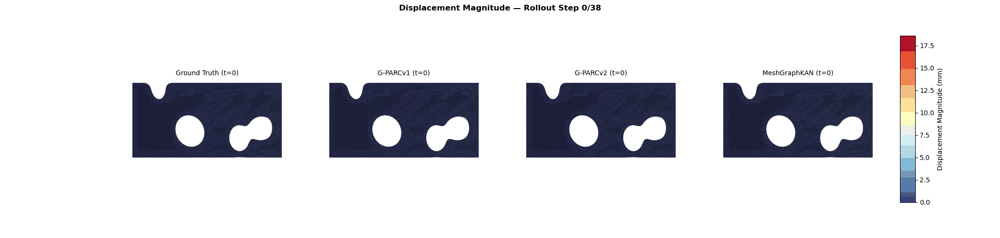

In [15]:
import matplotlib.colors as mcolors
from matplotlib.collections import PolyCollection

CMAP = 'RdYlBu_r'  # Standard structural mechanics colormap

def render_mesh(ax, pos, elements, node_values, eroded_mask, vmin, vmax, cmap_name=CMAP):
    cmap = plt.cm.get_cmap(cmap_name)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    
    if eroded_mask is not None:
        valid_mask = ~eroded_mask
    else:
        valid_mask = np.ones(len(elements), dtype=bool)
    
    valid_elems = elements[valid_mask]
    verts = pos[valid_elems]
    elem_vals = node_values[valid_elems].mean(axis=1)
    
    pc = PolyCollection(verts, facecolors=cmap(norm(elem_vals)),
                        edgecolors='black', linewidths=0.2, alpha=0.9)
    ax.add_collection(pc)
    ax.autoscale_view()
    ax.set_aspect('equal')
    ax.axis('off')

# ============================================================
# CREATE COMPARISON GIF FOR ONE SIMULATION
# ============================================================
SIM_IDX = 0
FPS = 6
if all_results and len(simulations) > SIM_IDX:
    sim = simulations[SIM_IDX]
    elements = sim[0].elements.cpu().numpy() if hasattr(sim[0], 'elements') else None
    pos_ref = sim[0].pos.cpu().numpy() if hasattr(sim[0], 'pos') else sim[0].x[:, :2].cpu().numpy()
    
    if elements is not None:
        model_names_avail = [m for m in all_results if len(all_results[m]['preds_phys']) > SIM_IDX]
        n_models = len(model_names_avail)
        
        if n_models > 0:
            n_steps = min(
                len(sim) - 1,
                *[len(all_results[m]['preds_phys'][SIM_IDX]) for m in model_names_avail]
            )
            
            if n_steps > 0:
                # Compute global value range from GROUND TRUTH only
                all_gt_vals = []
                for t in range(n_steps):
                    targ = all_results[model_names_avail[0]]['targs_phys'][SIM_IDX][t]
                    all_gt_vals.extend(np.sqrt(targ[:, 0]**2 + targ[:, 1]**2))
                vmax = np.percentile(all_gt_vals, 99)
                
                # Figure with extra space for colorbar
                fig, axes = plt.subplots(1, n_models + 1, figsize=(5 * (n_models + 1) + 1, 5))
                fig.subplots_adjust(right=0.88)
                
                # Add colorbar axis (fixed, not per-frame)
                cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])
                sm = plt.cm.ScalarMappable(cmap=CMAP, norm=mcolors.Normalize(vmin=0, vmax=vmax))
                sm.set_array([])
                cbar = fig.colorbar(sm, cax=cbar_ax)
                cbar.set_label('Displacement Magnitude (mm)', fontsize=10)
                
                def animate(frame):
                    for ax in axes:
                        ax.clear()
                        ax.axis('off')
                    
                    targ = all_results[model_names_avail[0]]['targs_phys'][SIM_IDX][frame]
                    disp_gt = np.sqrt(targ[:, 0]**2 + targ[:, 1]**2)
                    eroded = get_erosion_mask(sim[frame], len(elements))
                    
                    render_mesh(axes[0], pos_ref, elements, disp_gt, eroded, 0, vmax)
                    axes[0].set_title(f'Ground Truth (t={frame})', fontsize=10)
                    
                    for i, m in enumerate(model_names_avail):
                        pred = all_results[m]['preds_phys'][SIM_IDX][frame]
                        disp_pred = np.sqrt(pred[:, 0]**2 + pred[:, 1]**2)
                        render_mesh(axes[i + 1], pos_ref, elements, disp_pred, eroded, 0, vmax)
                        axes[i + 1].set_title(f'{m} (t={frame})', fontsize=10)
                    
                    fig.suptitle(f'Displacement Magnitude — Rollout Step {frame}/{n_steps-1}',
                                fontsize=12, fontweight='bold')
                    return list(axes)
                
                frames_to_use = list(range(0, n_steps, max(1, n_steps // 30)))
                if not frames_to_use:
                    frames_to_use = [0]
                
                print(f"Creating GIF with {len(frames_to_use)} frames...")
                anim = FuncAnimation(fig, animate, frames=frames_to_use, interval=1000//FPS, blit=False)
                
                gif_path = OUTPUT_DIR / f'comparison_rollout_sim{SIM_IDX}.gif'
                anim.save(gif_path, writer=PillowWriter(fps=FPS))
                plt.close(fig)
                
                print(f"✓ Saved comparison GIF: {gif_path}")
                display(Image(filename=str(gif_path)))
            else:
                print("⚠️ No timesteps available for animation")
        else:
            print("⚠️ No models available for comparison")
    else:
        print("⚠️ No element connectivity — cannot render mesh GIFs")

## Deformation 

Creating deformed GIF with 39 frames...


/tmp/ipykernel_606525/1240027520.py:61: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(CMAP)


✓ Saved deformed GIF: demo_outputs/comparison_deformed_sim0.gif


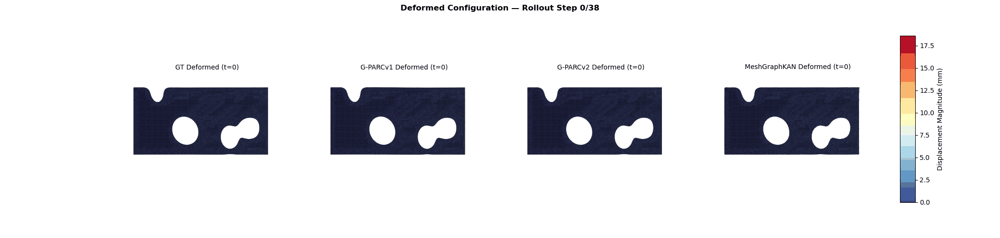

In [16]:
# ============================================================
# DEFORMED CONFIGURATION GIF — mesh moves with displacement
# ============================================================
SIM_IDX_DEF = 0  # Same simulation as reference GIF
FPS = 6

if all_results and len(simulations) > SIM_IDX_DEF:
    sim = simulations[SIM_IDX_DEF]
    elements = sim[0].elements.cpu().numpy() if hasattr(sim[0], 'elements') else None
    pos_ref = sim[0].pos.cpu().numpy() if hasattr(sim[0], 'pos') else sim[0].x[:, :2].cpu().numpy()
    x_ref = pos_ref[:, 0]
    y_ref = pos_ref[:, 1]
    
    if elements is not None:
        model_names_avail = [m for m in all_results if len(all_results[m]['preds_phys']) > SIM_IDX_DEF]
        n_models = len(model_names_avail)
        
        if n_models > 0:
            n_steps = min(
                len(sim) - 1,
                *[len(all_results[m]['preds_phys'][SIM_IDX_DEF]) for m in model_names_avail]
            )
            
            if n_steps > 0:
                # Compute deformed bounds across GT and all models
                pad_frac = 0.05
                all_x_def, all_y_def = [], []
                for t in range(n_steps):
                    targ = all_results[model_names_avail[0]]['targs_phys'][SIM_IDX_DEF][t]
                    all_x_def.append(x_ref + targ[:, 0])
                    all_y_def.append(y_ref + targ[:, 1])
                    for m in model_names_avail:
                        pred = all_results[m]['preds_phys'][SIM_IDX_DEF][t]
                        all_x_def.append(x_ref + pred[:, 0])
                        all_y_def.append(y_ref + pred[:, 1])
                
                x_all = np.concatenate(all_x_def)
                y_all = np.concatenate(all_y_def)
                x_lo, x_hi = x_all.min(), x_all.max()
                y_lo, y_hi = y_all.min(), y_all.max()
                pad_x = (x_hi - x_lo) * pad_frac
                pad_y = (y_hi - y_lo) * pad_frac
                
                # Value range from GT
                all_gt_disp = []
                for t in range(n_steps):
                    targ = all_results[model_names_avail[0]]['targs_phys'][SIM_IDX_DEF][t]
                    all_gt_disp.extend(np.sqrt(targ[:, 0]**2 + targ[:, 1]**2))
                vmax_def = np.percentile(all_gt_disp, 99)
                
                def filter_inverted(x_def, y_def, elems):
                    """Return mask of non-inverted elements."""
                    v0 = np.column_stack([x_def[elems[:, 0]], y_def[elems[:, 0]]])
                    v1 = np.column_stack([x_def[elems[:, 1]], y_def[elems[:, 1]]])
                    v2 = np.column_stack([x_def[elems[:, 2]], y_def[elems[:, 2]]])
                    cross = (v1[:, 0] - v0[:, 0]) * (v2[:, 1] - v0[:, 1]) - \
                            (v1[:, 1] - v0[:, 1]) * (v2[:, 0] - v0[:, 0])
                    return cross > 0  # Keep positive-area elements
                
                def render_deformed(ax, x_d, y_d, elems, node_values, eroded_mask, vmin, vmax):
                    cmap = plt.cm.get_cmap(CMAP)
                    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
                    
                    valid_elem_mask = ~eroded_mask if eroded_mask is not None else np.ones(len(elems), dtype=bool)
                    # Filter inverted elements
                    invert_mask = filter_inverted(x_d, y_d, elems)
                    valid_elem_mask = valid_elem_mask & invert_mask
                    
                    valid_elems = elems[valid_elem_mask]
                    pos_def = np.column_stack([x_d, y_d])
                    verts = pos_def[valid_elems]
                    elem_vals = node_values[valid_elems].mean(axis=1)
                    
                    pc = PolyCollection(verts, facecolors=cmap(norm(elem_vals)),
                                        edgecolors='black', linewidths=0.2, alpha=0.9)
                    ax.add_collection(pc)
                    ax.set_xlim(x_lo - pad_x, x_hi + pad_x)
                    ax.set_ylim(y_lo - pad_y, y_hi + pad_y)
                    ax.set_aspect('equal')
                    ax.axis('off')
                
                # Create figure with colorbar
                fig, axes = plt.subplots(1, n_models + 1, figsize=(5 * (n_models + 1) + 1, 5))
                fig.subplots_adjust(right=0.88)
                cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])
                sm = plt.cm.ScalarMappable(cmap=CMAP, norm=mcolors.Normalize(vmin=0, vmax=vmax_def))
                sm.set_array([])
                cbar = fig.colorbar(sm, cax=cbar_ax)
                cbar.set_label('Displacement Magnitude (mm)', fontsize=10)
                
                def animate_deformed(frame):
                    for ax in axes:
                        ax.clear()
                        ax.axis('off')
                    
                    # Ground truth deformed
                    targ = all_results[model_names_avail[0]]['targs_phys'][SIM_IDX_DEF][frame]
                    x_gt = x_ref + targ[:, 0]
                    y_gt = y_ref + targ[:, 1]
                    disp_gt = np.sqrt(targ[:, 0]**2 + targ[:, 1]**2)
                    eroded = get_erosion_mask(sim[frame], len(elements))
                    
                    render_deformed(axes[0], x_gt, y_gt, elements, disp_gt, eroded, 0, vmax_def)
                    axes[0].set_title(f'GT Deformed (t={frame})', fontsize=10)
                    
                    # Each model deformed
                    for i, m in enumerate(model_names_avail):
                        pred = all_results[m]['preds_phys'][SIM_IDX_DEF][frame]
                        x_pred = x_ref + pred[:, 0]
                        y_pred = y_ref + pred[:, 1]
                        disp_pred = np.sqrt(pred[:, 0]**2 + pred[:, 1]**2)
                        render_deformed(axes[i+1], x_pred, y_pred, elements, disp_pred, eroded, 0, vmax_def)
                        axes[i+1].set_title(f'{m} Deformed (t={frame})', fontsize=10)
                    
                    fig.suptitle(f'Deformed Configuration — Rollout Step {frame}/{n_steps-1}',
                                fontsize=12, fontweight='bold')
                    return list(axes)
                
                frames_to_use = list(range(0, n_steps, max(1, n_steps // 30)))
                if not frames_to_use:
                    frames_to_use = [0]
                
                print(f"Creating deformed GIF with {len(frames_to_use)} frames...")
                anim = FuncAnimation(fig, animate_deformed, frames=frames_to_use, interval=1000//FPS, blit=False)
                
                gif_path = OUTPUT_DIR / f'comparison_deformed_sim{SIM_IDX_DEF}.gif'
                anim.save(gif_path, writer=PillowWriter(fps=FPS))
                plt.close(fig)
                
                print(f"✓ Saved deformed GIF: {gif_path}")
                display(Image(filename=str(gif_path)))

---
## 9. Summary

### Key Findings

| Metric | G-PARCv1 | G-PARCv2 | MeshGraphKAN |
|--------|----------|----------|--------------|
| RRMSE  | See above | See above | See above |
| R²     | See above | See above | See above |

### Architecture Trade-offs

- **G-PARCv1**: Simplest architecture, fully learned operators. Fast inference, no physics priors.
- **G-PARCv2**: Physics-grounded MLS operators + numerical integration. Better generalization, but requires mesh initialization.
- **MeshGraphKAN**: KAN encoder captures nonlinear feature interactions. Competitive with G-PARC but higher parameter count.

### Reproducibility

All models trained on the same PLAID dataset split with global max normalization. Evaluation uses autoregressive rollout (no teacher forcing) across all test simulations.


In [18]:
# ============================================================
# FINAL SUMMARY TABLE
# ============================================================
if all_metrics:
    print("\n" + "=" * 70)
    print("FINAL COMPARISON TABLE")
    print("=" * 70)
    display(df_metrics[['RRMSE_total', 'RRMSE_Ux', 'RRMSE_Uy', 'R2', 'RMSE']].round(4))
    
    best_model = df_metrics['RRMSE_total'].idxmin()
    print(f"\n🏆 Best model by RRMSE: {best_model} ({df_metrics.loc[best_model, 'RRMSE_total']:.4f})")
    
    print(f"\nAll outputs saved to: {OUTPUT_DIR}")
    print("Files:")
    for f in sorted(OUTPUT_DIR.iterdir()):
        print(f"  {f.name}")



FINAL COMPARISON TABLE


,RRMSE_total,RRMSE_Ux,RRMSE_Uy,R2,RMSE
Model,,,,,
G-PARCv1,0.2236,0.3001,0.3069,0.5694,3.0538
G-PARCv2,0.1977,0.2620,0.2818,0.6966,2.5662
MeshGraphKAN,0.2962,0.3932,0.4143,0.1275,4.3575



🏆 Best model by RRMSE: G-PARCv2 (0.1977)

All outputs saved to: demo_outputs
Files:
  .ipynb_checkpoints
  comparison_deformed_sim0.gif
  comparison_metrics.json
  comparison_rollout_sim0.gif
  error_growth_comparison.png
  model_comparison_bars.png
  per_simulation_r2.png
  scatter_all_models.png
  training_curves_comparison.png
